# 컨볼루션 신경망(Convolution Neural Networks, CNN)

- 완전 연결 네트워크의 문제점으로부터 시작
  - 매개변수의 폭발적인 증가
  - 공간 추론의 부족: 픽셀 사이의 근접성 개념이 완전 연결 계층(Fully-Connected Layer)에서는 손실됨
- 동물의 시각피질(visual cortex, 視覺皮質)의 구조에서 영감을 받아 만들어진 딥러닝 신경망 모델
- 시각피질의 신경세포
  - 시야 내의 특정 영역에 대한 자극만 수용
  - 수용장(receptive field, 受容場)
  - 해당 영역의 특정 특징에 대해서만 반응
- 시각 자극이 1차 시각피질을 통해서 처리된 다음, 2차 시각피질을 경유하여, 3차 시각피질 등 여러 영역을 통과하여 계층적인 정보처리
- 정보가 계층적으로 처리되어 가면서 점차 추상적인 특징이 추출되어 시각 인식
- 동물의 계층적 특징 추출과 시각인식 체계를 참조하여 만들어진 모델
  - 전반부 : 컨볼루션 연산을 수행하여 특징 추출 
  - 후반부 : 특징을 이용하여 분류 
- 영상분류, 문자 인식 등 인식문제에 높은 성능 

  <img src="https://upload.wikimedia.org/wikipedia/commons/6/63/Typical_cnn.png">

# 컨볼루션 연산 (Convolution Operation)

- 필터(filter) 연산
  - 입력 데이터에 필터를 통한 어떠한 연산을 진행
  - 필터에 대응하는 원소끼리 곱하고, 그 합을 구함
  - 연산이 완료된 결과 데이터를 **특징 맵(feature map)**이라 부름

- 필터(filter)
  - 커널(kernel)이라고도 함
  - 이미지 처리에서 사용하는 '이미지 필터'와 비슷한 개념
  - 필터의 사이즈는 거의 항상 홀수
    - 짝수이면 패딩이 비대칭이 되어버림
    - 왼쪽, 오른쪽을 다르게 주어야함
    - 중심위치가 존재, 즉 구별된 하나의 픽셀(중심 픽셀)이 존재
  - 필터의 학습 파라미터 개수는 입력 데이터의 크기와 상관없이 일정  
  - 과적합을 방지할 수 있음

  <img src="https://theano-pymc.readthedocs.io/en/latest/_images/numerical_padding_strides.gif">

- 연산 시각화
  <img src="https://www.researchgate.net/profile/Ihab_S_Mohamed/publication/324165524/figure/fig3/AS:611103423860736@1522709818959/An-example-of-convolution-operation-in-2D-2.png" width="500">

- 일반적으로, 합성곱 연산을 한 후의 데이터 사이즈

  $\quad (n-f+1) \times (n-f+1)$

  $n$: 입력 데이터의 크기  
  $f$: 필터(커널)의 크기

  <img src="https://miro.medium.com/max/1400/1*Fw-ehcNBR9byHtho-Rxbtw.gif" width="400">

- 위 예에서 입력 데이터 크기($n$)는 5, 필터의 크기($k$)는 3이므로 출력 데이터의 크기는 $(5 - 3 + 1) = 3$

In [ ]:
import numpy as np
from sklearn.datasets import load_sample_image
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

from tensorflow.keras.layers import Conv2D

float64
(427, 640, 3)


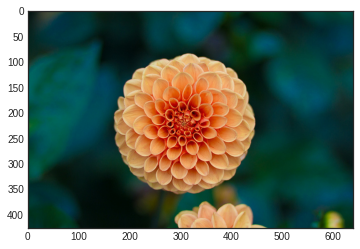

In [ ]:
flower = load_sample_image('flower.jpg') / 255 # 나누지 않으면 unsigned int(uint8), 나누면 float64
print(flower.dtype)
print(flower.shape)
plt.imshow(flower)
plt.show()

float64
(427, 640, 3)


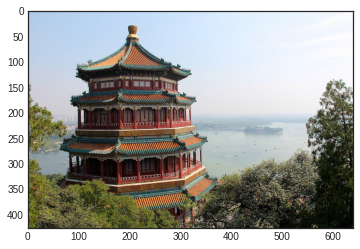

In [ ]:
china = load_sample_image('china.jpg') / 255
print(china.dtype)
print(china.shape)
plt.imshow(china)
plt.show()

In [ ]:
images = np.array([china, flower])
batch_size, height, width, channels = images.shape
print(images.shape)

(2, 427, 640, 3)


In [ ]:
filters = np.zeros(shape=(7, 7, channels, 2), dtype=np.float32)
filters[:, 3, :, 0] = 1
filters[3, :, :, 1] = 1

print(filters.shape)

(7, 7, 3, 2)


In [ ]:
conv = Conv2D(filters=16, kernel_size=3, activation='relu')

# 패딩(Padding)과 스트라이드(Stride)

- 필터(커널) 사이즈과 함께 입력 이미지와 출력 이미지의 사이즈를 결정하기 위해 사용
- 사용자가 결정할 수 있음


## 패딩(Padding)

- 입력 데이터의 주변을 특정 값으로 채우는 기법
  - 주로 0으로 많이 채움

  <img src="https://miro.medium.com/max/395/1*1okwhewf5KCtIPaFib4XaA.gif" width="300">

- 출력 데이터의 크기

  $\quad (n+2p-f+1) \times (n+2p-f+1)$

  - 위 그림에서, 입력 데이터의 크기($n$)는 5, 필터의 크기($f$)는 3, 패딩값($p$)은 2이므로 출력 데이터의 크기는 ($5 + 2\times 1 - 3 + 1) = 5$

- `valid`
  - 패딩을 주지 않음
  - `padding=0`은 0으로 채워진 테두리가 아니라 패딩을 주지 않는다는 의미
- `same`
  - 패딩을 주어 입력 이미지의 크기와 연산 후의 이미지 크기를 같도록 유지
  - 만약, 필터(커널)의 크기가 $k$ 이면, 패딩의 크기는 $p = \frac{k-1}{2}$ (단, stride=1)

## 스트라이드(Stride)

- 필터를 적용하는 간격을 의미
- 아래 예제 그림은 간격이 2

  <img src="https://miro.medium.com/max/294/1*BMngs93_rm2_BpJFH2mS0Q.gif">

## 출력 데이터의 크기

  $\qquad OH = \frac{H + 2P - FH}{S} + 1 $ 
  
  $\qquad OW = \frac{W + 2P - FW}{S} + 1 $ 

  - 입력 크기 : $(H, W)$
  - 필터 크기 : $(FH, FW)$
  - 출력 크기 : $(OH, OW)$
  - 패딩, 스트라이드 : $P, S$

- 위 식의 값에서 $\frac{H + 2P - FH}{S}$ 또는 $\frac{W + 2P - FW}{S}$가 정수로 나누어 떨어지는 값이어야 함
- 정수로 나누어 떨어지지 않으면, 패딩, 스트라이드 값을 조정하여 정수로 나누어 떨어지게 해야함
  
  

In [ ]:
conv = Conv2D(filters=16, kernel_size=3, padding='same', strides=1, activation='relu')

# 풀링(Pooling)

- 필터(커널) 사이즈 내에서 특정 값을 추출하는 과정

## 맥스 풀링(Max Pooling)

- 가장 많이 사용되는 방법
- 출력 데이터의 사이즈 계산은 컨볼루션 연산과 동일

  $\quad OH = \frac{H + 2P - FH}{S} + 1 $ 
  
  $\quad OW = \frac{W + 2P - FW}{S} + 1 $ 

- 일반적으로 stride=2, kernel_size=2 를 통해 특징맵의 크기를 절반으로 줄이는 역할
- 모델이 물체의 주요한 특징을 학습할 수 있도록 해주며, 컨볼루션 신경망이 이동 불변성 특성을 가지게 해줌
- 예를 들어, 아래의 그림에서 초록색 사각형 안에 있는 2와 8의 위치를 바꾼다해도 맥스 풀링 연산은 8을 추출
- 모델의 파라미터 개수를 줄여주고, 연산 속도를 빠르게 함

  <img src="https://cs231n.github.io/assets/cnn/maxpool.jpeg" width="600">

In [ ]:
from tensorflow.keras.layers import MaxPool2D

In [ ]:
print(flower.shape)
flower = np.expand_dims(flower, axis=0)
print(flower.shape)

max_pool = MaxPool2D(pool_size=2)
output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = MaxPool2D(pool_size=2)(output)
print(output.shape)

(427, 640, 3)
(1, 427, 640, 3)
(1, 213, 320, 32)


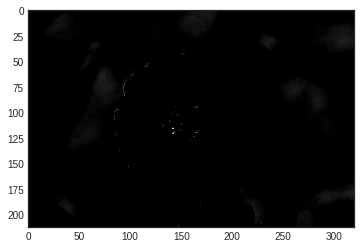

In [ ]:
plt.imshow(output[0, :, :, 4], cmap='gray')
plt.show()

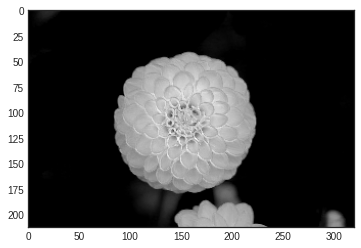

In [ ]:
plt.imshow(output[0, :, :, 8], cmap='gray')
plt.show()

## 평균 풀링(Avg Pooling)

- 필터 내의 있는 픽셀값의 평균을 구하는 과정
- 과거에 많이 사용, 요즘은 잘 사용되지 않음
- 맥스풀링과 마찬가지로 stride=2, kernel_size=2 를 통해 특징 맵의 사이즈를 줄이는 역할

  <img src="https://www.researchgate.net/profile/Juan_Pedro_Dominguez-Morales/publication/329885401/figure/fig21/AS:707709083062277@1545742402308/Average-pooling-example.png" width="600">


In [ ]:
from tensorflow.keras.layers import AvgPool2D

In [ ]:
print(flower.shape)

output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = AvgPool2D(pool_size=2)(output)
print(output.shape)

(1, 427, 640, 3)
(1, 213, 320, 32)


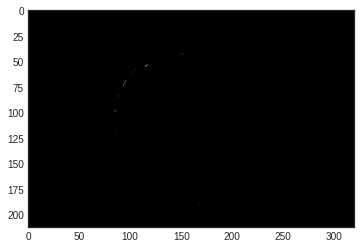

In [ ]:
plt.imshow(output[0, :, :, 2], cmap='gray')
plt.show()

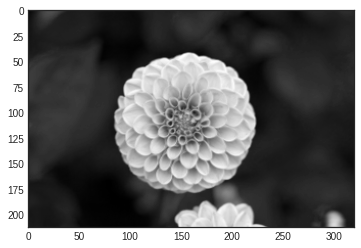

In [ ]:
plt.imshow(output[0, :, :, 8], cmap='gray')
plt.show()

## 전역 평균 풀링(Global Avg Pooling)

- 특징 맵 각각의 평균값을 출력하는 것이므로, 특성맵에 있는 대부분의 정보를 잃음
- 출력층에는 유용할 수 있음

In [ ]:
from tensorflow.keras.layers import GlobalAvgPool2D

In [ ]:
print(flower.shape)

output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = GlobalAvgPool2D()(output)
print(output.shape)

(1, 427, 640, 3)
(1, 32)


# 완전 연결 계층(Fully-Connected Layer)

- 입력으로 받은 텐서를 1차원으로 평면화(flatten) 함
- 밀집 계층(Dense Layer)라고도 함
- 일반적으로 분류기로서 네트워크의 마지막 계층에서 사용

In [ ]:
from tensorflow.keras.layers import Dense

In [ ]:
output_size = 64

In [ ]:
fc = Dense(units=output_size, activation='relu')

# 유효 수용 영역(ERF, Effective Receptive Field)

- 입력 이미지에서 거리가 먼 요소를 상호 참조하여 결합하여 네트워크 능력에 영향을 줌
- 입력 이미지의 영역을 정의해 주어진 계층을 위한 뉴런의 활성화에 영향을 미침
- 한 계층의 필터 크기나 윈도우 크기로 불리기 때문에 RF(receptive field, 수용 영역)이라는 용어를 흔히 볼 수 있음

  <img src="https://wiki.math.uwaterloo.ca/statwiki/images/8/8c/understanding_ERF_fig0.png">

- RF의 중앙에 위치한 픽셀은 주변에 있는 픽셀보다 더 높은 가중치를 가짐
  - 중앙부에 위치한 픽셀은 여러 개의 계층을 전파한 값
  - 중앙부에 있는 픽셀은 주변에 위치한 픽셀보다 더 많은 정보를 가짐

- 가우시안 분포를 따름

  <img src="https://www.researchgate.net/publication/316950618/figure/fig4/AS:495826810007552@1495225731123/The-receptive-field-of-each-convolution-layer-with-a-3-3-kernel-The-green-area-marks.png">

# CNN 모델 학습

## MNIST (LeNet)

- Yann LeCun 등의 제안(1998) 
- 5 계층 구조: Conv-Pool-Conv- Pool-Conv-FC-FC(SM) 
- 입력 : 32x32 필기체 숫자 영상 (MNIST 데이터) 
- 풀링 : 가중치x(2x2블록의 합) + 편차항  
- 시그모이드 활성화 함수 사용 
- 성능: 오차율 0.95%(정확도: 99.05%)

  <img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  <center>[LeNet-5 구조]</center>

### 모듈 임포트

In [ ]:
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras.datasets import mnist

import numpy as np

### 데이터 로드 및 전처리

In [ ]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train[..., np.newaxis], x_test[..., np.newaxis]

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(60000, 28, 28, 1)
(60000,)
(10000, 28, 28, 1)
(10000,)


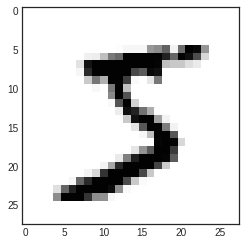

In [ ]:
plt.imshow(x_train[0, :, :, 0])

In [ ]:
x_train, x_test = x_train / 255.0, x_test /255.0

### 모델 구성 및 컴파일

In [ ]:
num_classes = 10
epochs = 30
batch_size = 32

In [ ]:
class LeNet5(Model):
  def __init__(self, num_classes):
    super(LeNet5, self).__init__()
    self.conv1 = Conv2D(6, kernel_size=(5, 5), padding='same', activation='relu')
    self.conv2 = Conv2D(16, kernel_size=(5, 5), activation='relu')
    self.max_pool = MaxPool2D(pool_size=(2, 2))
    self.flatten = Flatten()
    self.dense1 = Dense(120, activation='relu')
    self.dense2 = Dense(84, activation='relu')
    self.dense3 = Dense(num_classes, activation='softmax')

  def call(self, input_data):
    x = self.max_pool(self.conv1(input_data))
    x = self.max_pool(self.conv2(x))
    x = self.flatten(x)
    x = self.dense3(self.dense2(self.dense1(x)))
    return x

In [ ]:
model = LeNet5(num_classes)

In [ ]:
model.compile(optimizer='sgd',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
callbacks = [EarlyStopping(patience=3, monitor='val_loss'),
             TensorBoard(log_dir='./logs', histogram_freq=1, profile_batch=0)]

### 모델 학습 및 평가

In [ ]:
model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          validation_data=(x_test, y_test),
          callbacks=callbacks)

Epoch 1/30
1875/1875 [==============================] - 8s 4ms/step - loss: 0.4552 - accuracy: 0.8600 - val_loss: 0.1608 - val_accuracy: 0.9512
Epoch 2/30
1875/1875 [==============================] - 7s 4ms/step - loss: 0.1274 - accuracy: 0.9611 - val_loss: 0.0933 - val_accuracy: 0.9703
Epoch 3/30
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0908 - accuracy: 0.9726 - val_loss: 0.0746 - val_accuracy: 0.9770
Epoch 4/30
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0734 - accuracy: 0.9774 - val_loss: 0.0551 - val_accuracy: 0.9811
Epoch 5/30
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0624 - accuracy: 0.9808 - val_loss: 0.0667 - val_accuracy: 0.9783
Epoch 6/30
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0552 - accuracy: 0.9831 - val_loss: 0.0460 - val_accuracy: 0.9844
Epoch 7/30
1875/1875 [==============================] - 7s 4ms/step - loss: 0.0491 - accuracy: 0.9854 - val_loss: 0.0504 - val_accuracy:

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Fashion MNIST

<img src="https://www.tensorflow.org/tutorials/keras/classification_files/output_oZTImqg_CaW1_0.png?hl=ko" width="500">

### 모듈 임포트

In [ ]:
import datetime
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

plt.style.use('seaborn-white')

from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.datasets.fashion_mnist import load_data
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout, Input

### 데이터 로드 및 전처리

In [ ]:
(x_train, y_train), (x_test, y_test) = load_data()

x_train = x_train[..., np.newaxis]
x_test = x_test[..., np.newaxis]

x_train = x_train / 255.
x_test = x_test / 255.

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(60000, 28, 28, 1)
(60000,)
(10000, 28, 28, 1)
(10000,)


In [ ]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

### 모델 구성 및 학습
- 임의의 모델

In [ ]:
def build_model():
  model = Sequential()

  input = Input(shape=(28, 28, 1))
  output = Conv2D(filters=32, kernel_size=(3, 3))(input)
  output = Conv2D(filters=64, kernel_size=(3, 3))(output)
  output = Conv2D(filters=64, kernel_size=(3, 3))(output)
  output = Flatten()(output)
  output = Dense(128, activation='relu')(output)
  output = Dense(64, activation='relu')(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['acc'])
  
  return model

model_1 = build_model()
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 conv2d_8 (Conv2D)           (None, 24, 24, 64)        18496     
                                                                 
 conv2d_9 (Conv2D)           (None, 22, 22, 64)        36928     
                                                                 
 flatten_1 (Flatten)         (None, 30976)             0         
                                                                 
 dense_4 (Dense)             (None, 128)               3965056   
                                                                 
 dense_5 (Dense)             (None, 64)                8256  

In [ ]:
hist_1 = model_1.fit(x_train, y_train, epochs=25, batch_size=128, validation_split=0.3)

Epoch 1/25
329/329 [==============================] - 4s 10ms/step - loss: 0.5125 - acc: 0.8197 - val_loss: 0.3809 - val_acc: 0.8626
Epoch 2/25
329/329 [==============================] - 3s 10ms/step - loss: 0.3435 - acc: 0.8732 - val_loss: 0.3662 - val_acc: 0.8685
Epoch 3/25
329/329 [==============================] - 3s 9ms/step - loss: 0.2837 - acc: 0.8945 - val_loss: 0.3700 - val_acc: 0.8708
Epoch 4/25
329/329 [==============================] - 3s 10ms/step - loss: 0.2440 - acc: 0.9106 - val_loss: 0.3721 - val_acc: 0.8702
Epoch 5/25
329/329 [==============================] - 3s 9ms/step - loss: 0.2060 - acc: 0.9231 - val_loss: 0.3914 - val_acc: 0.8756
Epoch 6/25
329/329 [==============================] - 3s 10ms/step - loss: 0.1794 - acc: 0.9333 - val_loss: 0.4298 - val_acc: 0.8694
Epoch 7/25
329/329 [==============================] - 3s 9ms/step - loss: 0.1589 - acc: 0.9412 - val_loss: 0.4749 - val_acc: 0.8632
Epoch 8/25
329/329 [==============================] - 3s 9ms/step - loss

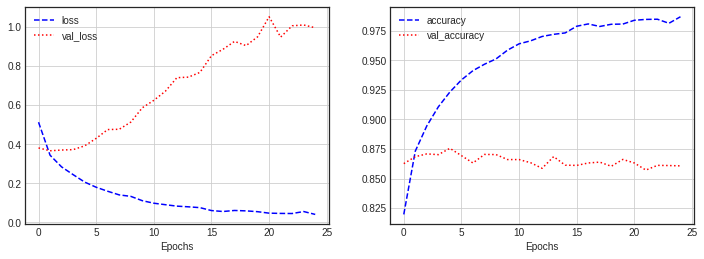

In [ ]:
hist_1.history.keys()

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_1.history['loss'], 'b--', label='loss')
plt.plot(hist_1.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_1.history['acc'], 'b--', label='accuracy')
plt.plot(hist_1.history['val_acc'], 'r:', label='val_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [ ]:
model_1.evaluate(x_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 1.1024 - acc: 0.8575


[1.1023766994476318, 0.8575000166893005]

### 모델 구성 및 학습: 과대적합 방지

- 학습 파라미터의 수 비교

In [ ]:
def build_model2():
  model = Sequential()

  input = Input(shape=(28, 28, 1))
  output = Conv2D(filters=32, kernel_size=(3, 3))(input)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Conv2D(filters=64, kernel_size=(3, 3))(output)
  output = Dropout(0.4)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Conv2D(filters=64, kernel_size=(3, 3))(output)
  output = Dropout(0.4)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Flatten()(output)
  output = Dense(128, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(64, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['acc'])
  
  return model

model_2 = build_model2()
model_2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 11, 11, 64)        18496     
                                                                 
 dropout (Dropout)           (None, 11, 11, 64)        0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                       

In [ ]:
hist_2 = model_2.fit(x_train, y_train,
                     epochs=40,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/40
329/329 [==============================] - 3s 7ms/step - loss: 1.1987 - acc: 0.5508 - val_loss: 0.7227 - val_acc: 0.7376
Epoch 2/40
329/329 [==============================] - 2s 6ms/step - loss: 0.7423 - acc: 0.7291 - val_loss: 0.5995 - val_acc: 0.7801
Epoch 3/40
329/329 [==============================] - 2s 6ms/step - loss: 0.6529 - acc: 0.7641 - val_loss: 0.5936 - val_acc: 0.7756
Epoch 4/40
329/329 [==============================] - 2s 6ms/step - loss: 0.6088 - acc: 0.7820 - val_loss: 0.5224 - val_acc: 0.8092
Epoch 5/40
329/329 [==============================] - 2s 6ms/step - loss: 0.5775 - acc: 0.7948 - val_loss: 0.5317 - val_acc: 0.8091
Epoch 6/40
329/329 [==============================] - 2s 6ms/step - loss: 0.5489 - acc: 0.8056 - val_loss: 0.5273 - val_acc: 0.8054
Epoch 7/40
329/329 [==============================] - 2s 6ms/step - loss: 0.5291 - acc: 0.8145 - val_loss: 0.4882 - val_acc: 0.8296
Epoch 8/40
329/329 [==============================] - 2s 6ms/step - loss: 0.

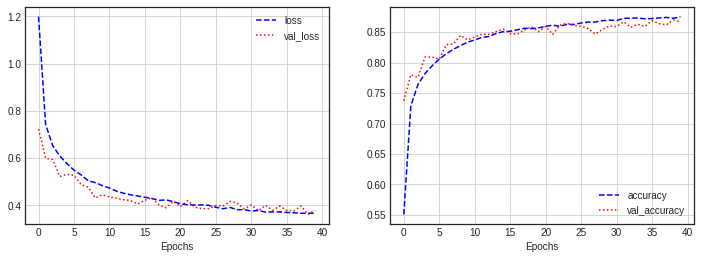

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_2.history['loss'], 'b--', label='loss')
plt.plot(hist_2.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_2.history['acc'], 'b--', label='accuracy')
plt.plot(hist_2.history['val_acc'], 'r:', label='val_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [ ]:
model_2.evaluate(x_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.3961 - acc: 0.8615


[0.3961164355278015, 0.8615000247955322]

### 모델 성능 높이기: 레이어 추가

In [ ]:
from tensorflow.keras.layers import BatchNormalization

In [ ]:
def build_model3():
  model = Sequential()

  input = Input(shape=(28, 28, 1))
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='valid')(input)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='valid')(input)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='valid')(input)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Flatten()(output)
  output = Dense(512, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(256, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['acc'])
  
  return model

model_3 = build_model3()
model_3.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_48 (Conv2D)          (None, 26, 26, 256)       2560      
                                                                 
 dropout_31 (Dropout)        (None, 26, 26, 256)       0         
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 13, 13, 256)      0         
 g2D)                                                            
                                                                 
 flatten_8 (Flatten)         (None, 43264)             0         
                                                                 
 dense_25 (Dense)            (None, 512)               22151680  
                                                           

In [ ]:
hist_3 = model_3.fit(x_train, y_train,
           epochs=25,
           validation_split=0.3,
           batch_size=128)

Epoch 1/25
329/329 [==============================] - 6s 16ms/step - loss: 0.5712 - acc: 0.7988 - val_loss: 0.3674 - val_acc: 0.8769
Epoch 2/25
329/329 [==============================] - 5s 16ms/step - loss: 0.3598 - acc: 0.8716 - val_loss: 0.3192 - val_acc: 0.8903
Epoch 3/25
329/329 [==============================] - 5s 16ms/step - loss: 0.3028 - acc: 0.8903 - val_loss: 0.2959 - val_acc: 0.8971
Epoch 4/25
329/329 [==============================] - 5s 16ms/step - loss: 0.2752 - acc: 0.8996 - val_loss: 0.2773 - val_acc: 0.9030
Epoch 5/25
329/329 [==============================] - 5s 16ms/step - loss: 0.2532 - acc: 0.9063 - val_loss: 0.2616 - val_acc: 0.9088
Epoch 6/25
329/329 [==============================] - 5s 16ms/step - loss: 0.2329 - acc: 0.9157 - val_loss: 0.2549 - val_acc: 0.9121
Epoch 7/25
329/329 [==============================] - 5s 16ms/step - loss: 0.2152 - acc: 0.9202 - val_loss: 0.2532 - val_acc: 0.9132
Epoch 8/25
329/329 [==============================] - 5s 16ms/step - 

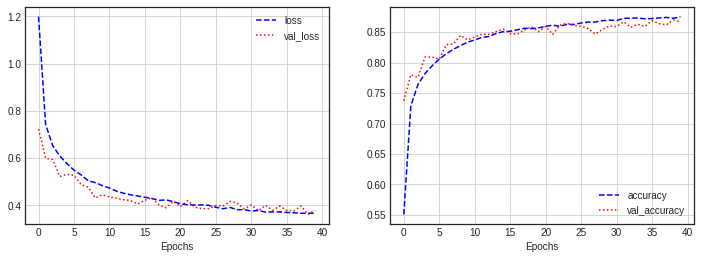

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_2.history['loss'], 'b--', label='loss')
plt.plot(hist_2.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_2.history['acc'], 'b--', label='accuracy')
plt.plot(hist_2.history['val_acc'], 'r:', label='val_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

- 과대적합은 되지 않았고, 층을 늘려도 좋은 성능을 낼 수 있음

In [ ]:
model_3.evaluate(x_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.2914 - acc: 0.9137


[0.29140910506248474, 0.9136999845504761]

### 모델 성능 높이기: 이미지 보강(Image Augmentation)

- 주요 인자 참고: https://keras.io/ko/preprocessing/image/

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
image_generator = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.2,
    shear_range=0.6,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False
)

augment_size = 200

print(x_train.shape)
print(x_train[0].shape)

(60000, 28, 28, 1)
(28, 28, 1)


In [ ]:
x_augment = image_generator.flow(np.tile(x_train[0].reshape(28*28*1), augment_size).reshape(-1, 28, 28, 1),
                                         np.zeros(augment_size), batch_size=augment_size, shuffle=False).next()[0]

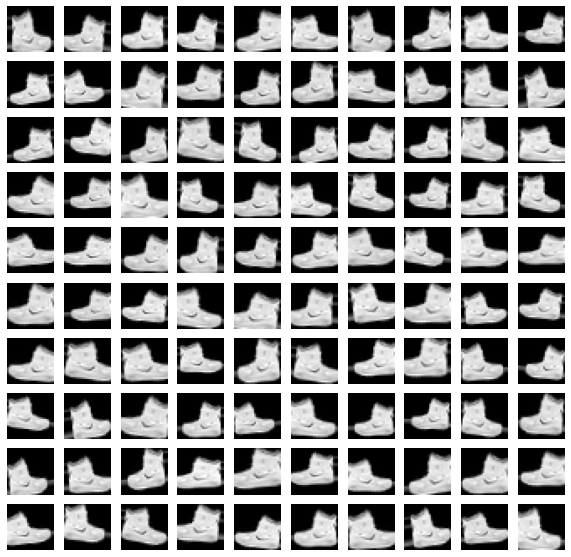

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(1, 101):
  plt.subplot(10, 10, i)
  plt.axis('off')
  plt.imshow(x_augment[i-1].reshape(28, 28), cmap='gray')

데이터 추가

In [ ]:
image_generator = ImageDataGenerator(
    rotation_range=15,
    zoom_range=0.1,
    shear_range=0.6,
    width_shift_range=0.15,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False
)

augment_size = 30000

random_mask = np.random.randint(x_train.shape[0], size=augment_size)
x_augmented = x_train[random_mask].copy()
y_augmented = y_train[random_mask].copy()

In [ ]:
x_augmented = image_generator.flow(x_augmented, np.zeros(augment_size), 
                                   batch_size=augment_size, shuffle=False).next()[0]

x_train = np.concatenate((x_train, x_augmented))
y_train = np.concatenate((y_train, y_augmented))

print(x_train.shape)
print(y_train.shape)

(90000, 28, 28, 1)
(90000,)


In [ ]:
model_4 = build_model3()
model_4.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_54 (Conv2D)          (None, 26, 26, 256)       2560      
                                                                 
 dropout_36 (Dropout)        (None, 26, 26, 256)       0         
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 13, 13, 256)      0         
 g2D)                                                            
                                                                 
 flatten_9 (Flatten)         (None, 43264)             0         
                                                                 
 dense_28 (Dense)            (None, 512)               22151680  
                                                           

In [ ]:
hist_4 = model_4.fit(x_train, y_train,
                     epochs=40,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/40
493/493 [==============================] - 9s 16ms/step - loss: 0.5618 - acc: 0.7986 - val_loss: 1.0274 - val_acc: 0.6533
Epoch 2/40
493/493 [==============================] - 8s 16ms/step - loss: 0.3634 - acc: 0.8699 - val_loss: 0.9227 - val_acc: 0.7003
Epoch 3/40
493/493 [==============================] - 8s 16ms/step - loss: 0.3135 - acc: 0.8855 - val_loss: 0.8122 - val_acc: 0.7262
Epoch 4/40
493/493 [==============================] - 8s 16ms/step - loss: 0.2847 - acc: 0.8970 - val_loss: 0.7625 - val_acc: 0.7293
Epoch 5/40
493/493 [==============================] - 8s 16ms/step - loss: 0.2619 - acc: 0.9027 - val_loss: 0.7338 - val_acc: 0.7314
Epoch 6/40
493/493 [==============================] - 8s 16ms/step - loss: 0.2421 - acc: 0.9109 - val_loss: 0.7337 - val_acc: 0.7312
Epoch 7/40
493/493 [==============================] - 8s 16ms/step - loss: 0.2231 - acc: 0.9166 - val_loss: 0.7023 - val_acc: 0.7326
Epoch 8/40
493/493 [==============================] - 8s 16ms/step - 

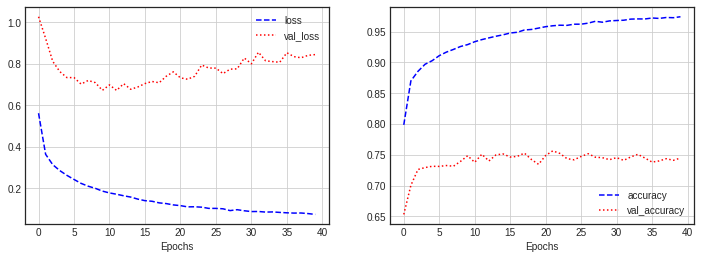

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(hist_4.history['loss'], 'b--', label='loss')
plt.plot(hist_4.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_4.history['acc'], 'b--', label='accuracy')
plt.plot(hist_4.history['val_acc'], 'r:', label='val_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

- 학습 인자를 이전과 다르게 주면서 학습하면 더 잘 나올것으로 판단

In [ ]:
model_4.evaluate(x_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.3222 - acc: 0.9219


[0.32216876745224, 0.9218999743461609]

## CIFAR-10

* CIFAR-10
  - 10개의 클래스로 구분된 32 x 32 사물 사진을 모은 데이터셋
  - 50,000개의 학습데이터, 10,000개의 테스트 데이터로 구성
  - 데이터 복잡도가 MNIST보다 훨씬 높은 특징이 있음
    - 단순한 신경망으로 특징을 검출하기 어려움


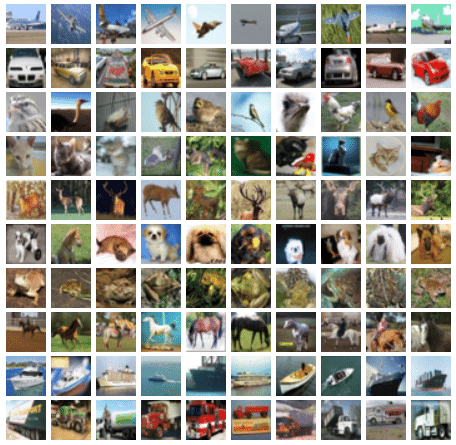

### 모듈 임포트

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Input, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split
plt.style.use('seaborn-white')

import numpy as np

### 데이터 로드 및 전처리

In [ ]:
(x_train_full, y_train_full), (x_test, y_test) = cifar10.load_data()

print(x_train_full.shape, y_train_full.shape)
print(x_test.shape, y_test.shape)

170508288/170498071 [==============================] - 2s 0us/step
(50000, 32, 32, 3) (50000, 1)
(10000, 32, 32, 3) (10000, 1)


In [ ]:
x_train_full

array([[[[ 59,  62,  63],
         [ 43,  46,  45],
         [ 50,  48,  43],
         ...,
         [158, 132, 108],
         [152, 125, 102],
         [148, 124, 103]],

        [[ 16,  20,  20],
         [  0,   0,   0],
         [ 18,   8,   0],
         ...,
         [123,  88,  55],
         [119,  83,  50],
         [122,  87,  57]],

        [[ 25,  24,  21],
         [ 16,   7,   0],
         [ 49,  27,   8],
         ...,
         [118,  84,  50],
         [120,  84,  50],
         [109,  73,  42]],

        ...,

        [[208, 170,  96],
         [201, 153,  34],
         [198, 161,  26],
         ...,
         [160, 133,  70],
         [ 56,  31,   7],
         [ 53,  34,  20]],

        [[180, 139,  96],
         [173, 123,  42],
         [186, 144,  30],
         ...,
         [184, 148,  94],
         [ 97,  62,  34],
         [ 83,  53,  34]],

        [[177, 144, 116],
         [168, 129,  94],
         [179, 142,  87],
         ...,
         [216, 184, 140],
        

In [ ]:
print(y_test[5])

[6]


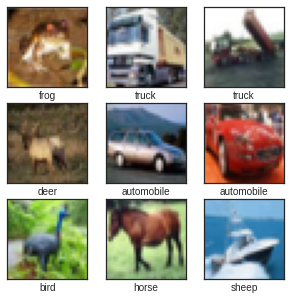

In [ ]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'sheep', 'truck']

random_idx = np.random.randint(50000, size=9)

plt.figure(figsize=(5, 5))
for i, idx in enumerate(random_idx):
  plt.subplot(3, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(x_train_full[i])
  plt.xlabel(class_names[int(y_train_full[i])])

plt.show()

In [ ]:
x_mean = np.mean(x_train_full, axis=(0, 1, 2))
x_std = np.std(x_train_full, axis=(0, 1, 2))

x_train_full = (x_train_full - x_mean) / x_std
x_test = (x_test - x_mean) / x_std

x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size=0.2)

print(x_train.shape)
print(y_train.shape)

print(x_val.shape)
print(y_val.shape)

print(x_test.shape)
print(y_test.shape)

(40000, 32, 32, 3)
(40000, 1)
(10000, 32, 32, 3)
(10000, 1)
(10000, 32, 32, 3)
(10000, 1)


### 모델 구성 및 학습


In [ ]:
def model_build():
  model = Sequential()

  input = Input(shape=(32, 32, 3))

  output = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(input)
  output = MaxPool2D(pool_size=(2, 2), strides=2, padding='same')(output)

  output = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(output)
  output = MaxPool2D(pool_size=(2, 2), strides=2, padding='same')(output)

  output = Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(output)
  output = MaxPool2D(pool_size=(2, 2), strides=2, padding='same')(output)

  output = Flatten()(output)
  output = Dense(256, activation='relu')(output)
  output = Dense(126, activation='relu')(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer=Adam(learning_rate=1e-4),
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])
  return model

In [ ]:
model = model_build()
model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_58 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_59 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 8, 8, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_60 (Conv2D)          (None, 8, 8, 128)         7385

In [ ]:
history = model.fit(x_train, y_train,
                    epochs=30,
                    batch_size=256,
                    validation_data=(x_val, y_val))

Epoch 1/30
157/157 [==============================] - 2s 11ms/step - loss: 1.8673 - accuracy: 0.3341 - val_loss: 1.6274 - val_accuracy: 0.4254
Epoch 2/30
157/157 [==============================] - 1s 9ms/step - loss: 1.5137 - accuracy: 0.4622 - val_loss: 1.4243 - val_accuracy: 0.5008
Epoch 3/30
157/157 [==============================] - 1s 8ms/step - loss: 1.3617 - accuracy: 0.5196 - val_loss: 1.3283 - val_accuracy: 0.5344
Epoch 4/30
157/157 [==============================] - 1s 8ms/step - loss: 1.2785 - accuracy: 0.5517 - val_loss: 1.2587 - val_accuracy: 0.5619
Epoch 5/30
157/157 [==============================] - 1s 9ms/step - loss: 1.2087 - accuracy: 0.5775 - val_loss: 1.2109 - val_accuracy: 0.5745
Epoch 6/30
157/157 [==============================] - 1s 9ms/step - loss: 1.1492 - accuracy: 0.5988 - val_loss: 1.1860 - val_accuracy: 0.5910
Epoch 7/30
157/157 [==============================] - 1s 8ms/step - loss: 1.1102 - accuracy: 0.6149 - val_loss: 1.1448 - val_accuracy: 0.5988
Epoch

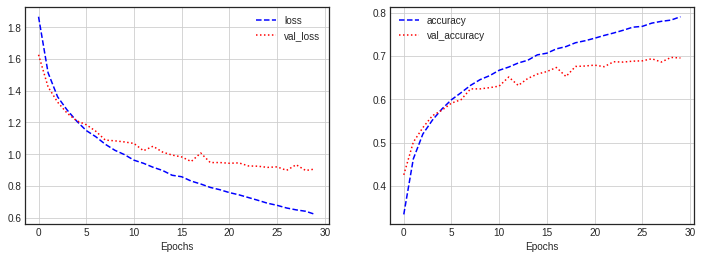

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], 'b--', label='loss')
plt.plot(history.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], 'b--', label='accuracy')
plt.plot(history.history['val_accuracy'], 'r:', label='val_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

### 모델 구성 및 학습: 과대적합 방지


- 해당 모델은 성능이 좋지 않음
- 규제화, 드롭아웃 등 과대적합을 방지하는 기술 필요

In [ ]:
def build_model2():
  model = Sequential()

  input = Input(shape=(32, 32, 3))
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='valid')(input)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='valid')(input)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='valid')(input)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2, 2))(output)
  output = Flatten()(output)
  output = Dense(512, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(256, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])
  
  return model

In [ ]:
model = build_model2()
model.summary()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_66 (Conv2D)          (None, 30, 30, 256)       7168      
                                                                 
 dropout_41 (Dropout)        (None, 30, 30, 256)       0         
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 15, 15, 256)      0         
 g2D)                                                            
                                                                 
 flatten_11 (Flatten)        (None, 57600)             0         
                                                                 
 dense_34 (Dense)            (None, 512)               29491712  
                                                          

In [ ]:
history = model.fit(x_train, y_train,
                    epochs=100,
                    batch_size=512,
                    validation_data=(x_val, y_val))

Epoch 1/100
79/79 [==============================] - 5s 54ms/step - loss: 2.2475 - accuracy: 0.2335 - val_loss: 1.7939 - val_accuracy: 0.4352
Epoch 2/100
79/79 [==============================] - 4s 50ms/step - loss: 1.6762 - accuracy: 0.3850 - val_loss: 1.5552 - val_accuracy: 0.5162
Epoch 3/100
79/79 [==============================] - 4s 50ms/step - loss: 1.5178 - accuracy: 0.4483 - val_loss: 1.4226 - val_accuracy: 0.5397
Epoch 4/100
79/79 [==============================] - 4s 50ms/step - loss: 1.4051 - accuracy: 0.4853 - val_loss: 1.3608 - val_accuracy: 0.5794
Epoch 5/100
79/79 [==============================] - 4s 50ms/step - loss: 1.3285 - accuracy: 0.5197 - val_loss: 1.3067 - val_accuracy: 0.6051
Epoch 6/100
79/79 [==============================] - 4s 50ms/step - loss: 1.2700 - accuracy: 0.5405 - val_loss: 1.2468 - val_accuracy: 0.6121
Epoch 7/100
79/79 [==============================] - 4s 50ms/step - loss: 1.2206 - accuracy: 0.5639 - val_loss: 1.2361 - val_accuracy: 0.6089
Epoch 

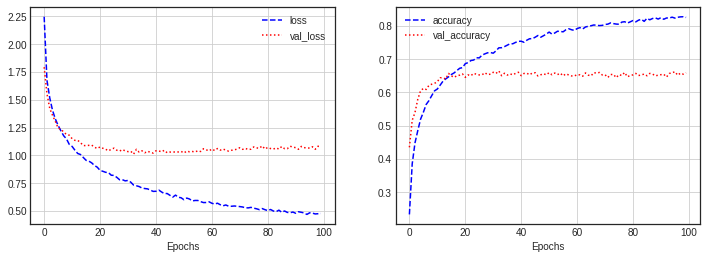

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], 'b--', label='loss')
plt.plot(history.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], 'b--', label='accuracy')
plt.plot(history.history['val_accuracy'], 'r:', label='val_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

# CNN 모델의 발전

* 1998: LeNet – Gradient-based Learning Applied to Document Recognition
* 2012: AlexNet – ImageNet Classification with Deep Convolutional Neural Network
* **2014: VggNet – Very Deep Convolutional Networks for Large-Scale Image Recognition**
* **2014: GoogLeNet – Going Deeper with Convolutions**
* 2014: SppNet – Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition
* **2015: ResNet – Deep Residual Learning for Image Recognition**
* **2016: Xception – Xception: Deep Learning with Depthwise Separable Convolutions**
* **2017: MobileNet – MobileNets: Efficient Convolutional Neural Networks for Mobile Vision Application**
* **2017: DenseNet – Densely Connected Convolutional Networks**
* 2017: SeNet – Squeeze and Excitation Networks
* 2017: ShuffleNet – ShuffleNet: An Extremely Efficient Convolutional Neural Network for Mobile Devices
* **2018: NasNet – Learning Transferable Architectures for Scalable Image Recognition**
* 2018: Bag of Tricks – Bag of Tricks for Image Classification with Convolutional Neural Networks
* **2019: EfficientNet – EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks**


## VGGNet(Visual Geometry Group Net)

- 2014년 ILSVRC에서 2등 차지 (상위-5 오류율: 7.32%), 이 후의 수많은 연구에 영향을 미침

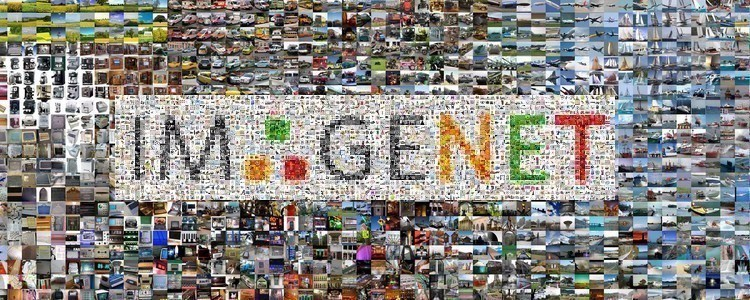

- 특징
  - 활성화 함수로 `ReLU` 사용, Dropout 적용
  - 합성곱과 풀링 계층으로 구성된 블록과 분류를 위한 완전 연결계층으로 결합된 전형적인 구조
  - 이미지 변환, 좌우 반전 등의 변환을 시도하여 인위적으로 데이터셋을 늘림
  - 몇 개의 합성곱 계층과 최대-풀링 계층이 따르는 5개의 블록과, 3개의 완전연결계층(학습 시, 드롭아웃 사용)으로 구성
  - 모든 합성곱과 최대-풀링 계층에 `padding='SAME'` 적용
  - 합성곱 계층에는 `stride=1`, 활성화 함수로 `ReLU` 사용
  - 특징 맵 깊이를 증가시킴
  - 척도 변경을 통한 데이터 보강(Data Augmentation)

- 기여

  - 3x3 커널을 갖는 두 합성곱 계층을 쌓은 스택이 5x5 커널을 갖는 하나의 합성곱 계층과 동일한 수용영역(ERF)을 가짐
  - 11x11 사이즈의 필터 크기를 가지는 AlexNet과 비교하여, 더 작은 합성곱 계층을 더 많이 포함해 더 큰 ERF를 얻음
  - 합성곱 계층의 개수가 많아지면, 매개변수 개수를 줄이고, 비선형성을 증가시킴

- VGG-16 모델(16개 층)

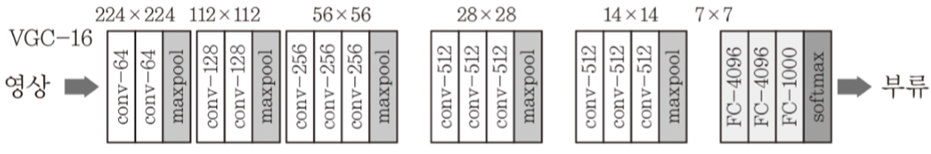

- VGG-19 모델(19개 층)  

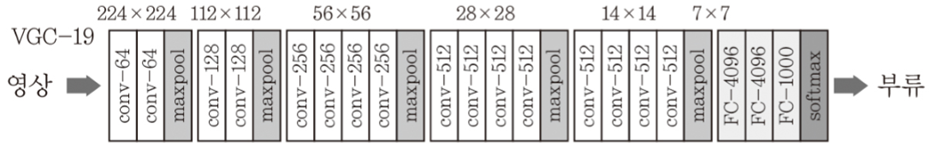

- ImageNet에서 훈련이 끝난 후 얻게된 매개변수 값 로딩
- 네트워크를 다시 처음부터 학습하고자 한다면 `weights=None`으로 설정, 케라스에서 무작위로 가중치를 설정함
- `include_top=False`: VGG의 밀집 계층을 제외한다는 뜻
- 해당 네트워크의 출력은 합성곱/최대-풀링 블록의 특징맵이 됨
- `pooling`: 특징맵을 반환하기 전에 적용할 선택적인 연산을 지정

In [ ]:
from keras.preprocessing import image
from keras.applications.vgg19 import VGG19, preprocess_input, decode_predictions

vggnet = VGG19(include_top=True, weights='imagenet',
               input_tensor=None, input_shape=None,
               pooling=None, classes=1000)
vggnet.summary()

574726144/574710816 [==============================] - 5s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

* dog.jpg (https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg)

In [ ]:
!wget -O dog.jpg https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg

--2021-11-19 13:28:57--  https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg
Resolving www.publicdomainpictures.net (www.publicdomainpictures.net)... 104.20.44.162, 172.67.2.204, 104.20.45.162, ...
Connecting to www.publicdomainpictures.net (www.publicdomainpictures.net)|104.20.44.162|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 88498 (86K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>]  86.42K  --.-KB/s    in 0.008s  

2021-11-19 13:28:57 (11.0 MB/s) - ‘dog.jpg’ saved [88498/88498]



49152/35363 [=========================================] - 0s 0us/step
[[('n02088364', 'beagle', 0.8393819), ('n02089973', 'English_foxhound', 0.088347524), ('n02089867', 'Walker_hound', 0.062388126), ('n02088238', 'basset', 0.0045650806), ('n02088632', 'bluetick', 0.0033394513)]]


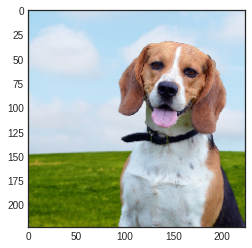

In [ ]:
img = image.load_img('dog.jpg', target_size=(224, 224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = vggnet.predict(x)
print(decode_predictions(preds))

## GoogLeNet, Inception

- VGGNet을 제치고 같은 해 분류 과제에서 1등을 차지
- 인셉션 블록이라는 개념을 도입하여, **인셉션 네트워크(Inception Network)**라고도 불림

  <img src="https://miro.medium.com/max/2800/0*rbWRzjKvoGt9W3Mf.png">

- 특징 
  - CNN 계산 용량을 최적화하는 것을 고려
  - 전형적인 합성곱, 풀링 계층으로 시작하고, 이 정보는 9개의 인셉션 모듈 스택을 통과 (해당 모듈을 하위 네트워크라고도 함)
  - 각 모듈에서 입력 특징 맵은 서로 다른 계층으로 구성된 4개의 병렬 하위 블록에 전달되고, 이를 서로 다시 연결
  - 모든 합성곱과 풀링 계층의 `padding`옵션은 `'SAME'`이며 `stride=1` 활성화 함수는 `ReLU` 사용

- 기여
  - 규모가 큰 블록과 병목을 보편화
  - 병목 계층으로 1x1 합성곱 계층 사용
  - 완전 연결 계층 대신 풀링 계층 사용
  - 중간 소실로 경사 소실 문제 해결

  <img src="https://norman3.github.io/papers/images/google_inception/f01.png">

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions

inception = InceptionV3(include_top=True, weights='imagenet',
                        input_tensor=None, input_shape=None,
                        pooling=None, classes=1000)
inception.summary()

96124928/96112376 [==============================] - 1s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_67 (Conv2D)             (None, 149, 149, 32  864         ['input_16[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_23 (BatchN  (None, 149, 149, 32  96         ['conv2d_67[0][0]']              
 ormalization)        

* fish.jpg (https://upload.wikimedia.org/wikipedia/commons/7/7a/Goldfish_1.jpg)

In [ ]:
!wget -O fish.jpg https://upload.wikimedia.org/wikipedia/commons/7/7a/Goldfish_1.jpg

--2021-11-19 13:35:15--  https://upload.wikimedia.org/wikipedia/commons/7/7a/Goldfish_1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4648040 (4.4M) [image/jpeg]
Saving to: ‘fish.jpg’

fish.jpg            100%[===================>]   4.43M  18.6MB/s    in 0.2s    

2021-11-19 13:35:16 (18.6 MB/s) - ‘fish.jpg’ saved [4648040/4648040]



[[('n01443537', 'goldfish', 0.9748303), ('n02701002', 'ambulance', 0.0023265795), ('n02606052', 'rock_beauty', 0.0019084804), ('n02607072', 'anemone_fish', 0.0006640256), ('n09256479', 'coral_reef', 0.00043217852)]]


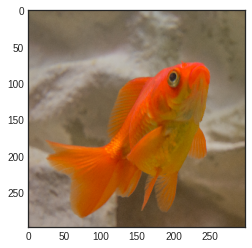

In [ ]:
img = image.load_img('fish.jpg', target_size=(299, 299))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = inception.predict(x)
print(decode_predictions(preds))

## ResNet(Residual Net)

- 네트워크의 깊이가 깊어질수록 경사가 소실되거나 폭발하는 문제를 해결하고자 함
- 병목 합성곱 계층을 추가하거나 크기가 작은 커널을 사용
- 152개의 훈련가능한 계층을 수직으로 연결하여 구성
- 모든 합성곱과 풀링 계층에서 패딩옵션으로 `'SAME'`, `stride=1` 사용
- 3x3 합성곱 계층 다음마다 배치 정규화 적용, 1x1 합성곱 계층에는 활성화 함수가 존재하지 않음

  <img src="https://miro.medium.com/max/1200/1*6hF97Upuqg_LdsqWY6n_wg.png">

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

resnet = ResNet50(include_top=True, weights='imagenet',
                  input_tensor=None, input_shape=None,
                  pooling=None, classes=1000)

resnet.summary()

102981632/102967424 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_17[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                        

* bee.jpg (https://upload.wikimedia.org/wikipedia/commons/4/4d/Apis_mellifera_Western_honey_bee.jpg)

In [ ]:
!wget -O bee.jpg https://upload.wikimedia.org/wikipedia/commons/4/4d/Apis_mellifera_Western_honey_bee.jpg

--2021-11-19 13:39:41--  https://upload.wikimedia.org/wikipedia/commons/4/4d/Apis_mellifera_Western_honey_bee.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2421052 (2.3M) [image/jpeg]
Saving to: ‘bee.jpg’

bee.jpg             100%[===================>]   2.31M  --.-KB/s    in 0.1s    

2021-11-19 13:39:42 (15.5 MB/s) - ‘bee.jpg’ saved [2421052/2421052]



[[('n02206856', 'bee', 0.9990995), ('n03530642', 'honeycomb', 0.0005614693), ('n02190166', 'fly', 0.00014320078), ('n02727426', 'apiary', 0.00010164116), ('n02219486', 'ant', 5.7396e-05)]]


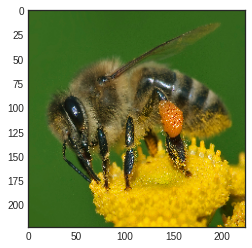

In [ ]:
img = image.load_img('bee.jpg', target_size=(224, 224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = resnet.predict(x)
print(decode_predictions(preds))

## Xception

* Inception module을 이용하여 depthwise convolution 적용

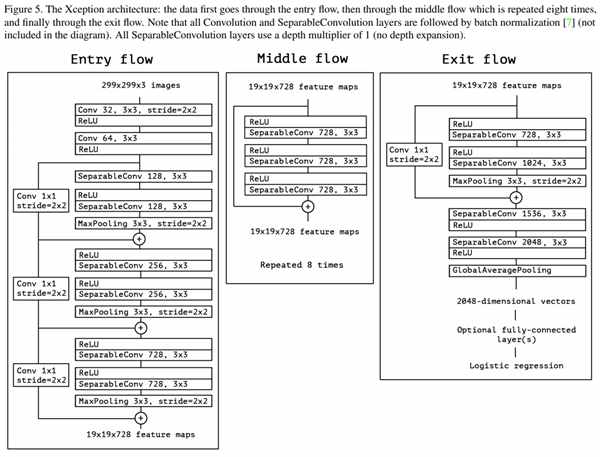

* 기존의 Conv layer에서 얻은 feature map을 각 채널별로 다른 Conv layer에 적용하여 feature map을 얻음

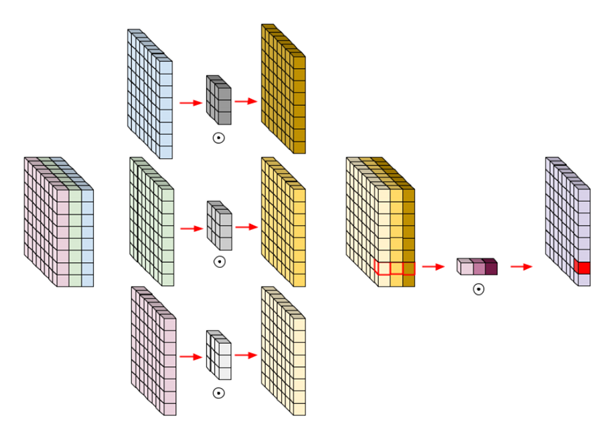

In [ ]:
from tensorflow.keras.applications.xception import Xception, preprocess_input, decode_predictions

xception = Xception(include_top=True, weights='imagenet',
                    input_tensor=None, input_shape=None,
                    pooling=None, classes=1000)
xception.summary()

91897856/91884032 [==============================] - 1s 0us/step
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 149, 149, 32  864         ['input_18[0][0]']               
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 149, 149, 32  128        ['block1_conv1[0][0]']           
 ation)                   

* beaver.jpg (https://upload.wikimedia.org/wikipedia/commons/6/6b/American_Beaver.jpg)

In [ ]:
!wget -O beaver.jpg https://upload.wikimedia.org/wikipedia/commons/6/6b/American_Beaver.jpg

--2021-11-19 13:43:33--  https://upload.wikimedia.org/wikipedia/commons/6/6b/American_Beaver.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 186747 (182K) [image/jpeg]
Saving to: ‘beaver.jpg’

beaver.jpg          100%[===================>] 182.37K  --.-KB/s    in 0.06s   

2021-11-19 13:43:33 (3.07 MB/s) - ‘beaver.jpg’ saved [186747/186747]



[[('n02363005', 'beaver', 0.8278394), ('n02361337', 'marmot', 0.05981989), ('n02493509', 'titi', 0.0044267965), ('n02442845', 'mink', 0.002407209), ('n01883070', 'wombat', 0.0019868787)]]


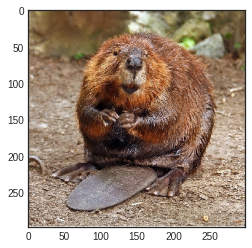

In [ ]:
img = image.load_img('beaver.jpg', target_size=(299, 299))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = xception.predict(x)
print(decode_predictions(preds))

## MobileNet

* 성능보다 모델의 크기 또는 연산 속도 감소
* Depthwise conv와 Pointwise conv 사이에도 batch normalization과 ReLU를 삽입
* Conv layer를 활용한 모델과 정확도는 비슷하면서 계산량은 9배, 파라미터 수는 7배 줄임

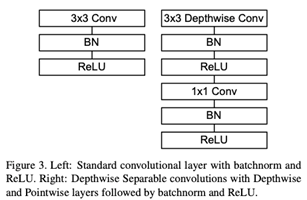

In [ ]:
from tensorflow.keras.applications.mobilenet import MobileNet, preprocess_input, decode_predictions

mobilenet = MobileNet(include_top=True, weights='imagenet',
                      input_tensor=None, input_shape=None,
                      pooling=None, classes=1000)
mobilenet.summary()

17235968/17225924 [==============================] - 0s 0us/step
Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32

* crane.jpg (https://p1.pxfuel.com/preview/42/50/534/europe-channel-crane-harbour-crane-harbour-cranes-cranes-transport.jpg)

In [ ]:
!wget -O crane.jpg https://p1.pxfuel.com/preview/42/50/534/europe-channel-crane-harbour-crane-harbour-cranes-cranes-transport.jpg

--2021-11-19 13:47:24--  https://p1.pxfuel.com/preview/42/50/534/europe-channel-crane-harbour-crane-harbour-cranes-cranes-transport.jpg
Resolving p1.pxfuel.com (p1.pxfuel.com)... 104.21.89.53, 172.67.188.34, 2606:4700:3037::6815:5935, ...
Connecting to p1.pxfuel.com (p1.pxfuel.com)|104.21.89.53|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 86911 (85K) [image/jpeg]
Saving to: ‘crane.jpg’

crane.jpg           100%[===================>]  84.87K   482KB/s    in 0.2s    

2021-11-19 13:47:25 (482 KB/s) - ‘crane.jpg’ saved [86911/86911]



[[('n03126707', 'crane', 0.96001226), ('n03216828', 'dock', 0.029438632), ('n03240683', 'drilling_platform', 0.0051289643), ('n03344393', 'fireboat', 0.0026267334), ('n04366367', 'suspension_bridge', 0.00050067337)]]


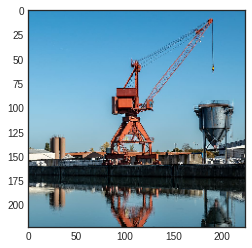

In [ ]:
img = image.load_img('crane.jpg', target_size=(224, 224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = mobilenet.predict(x)
print(decode_predictions(preds))

## DenseNet

* 각 층은 모든 앞 단계에서 올 수 있는 지름질 연결 구성
* 특징지도의 크기를 줄이기 위해 풀링 연산 적용 필요
* 밀집 블록(dense block)과 전이층(transition layer)으로 구성 
* 전이층 : 1x1 컨볼루션과 평균값 풀링(APool)으로 구성   

<img src="https://oi.readthedocs.io/en/latest/_images/cnn_vs_resnet_vs_densenet.png" width="700">

In [ ]:
from tensorflow.keras.applications.densenet import DenseNet201, preprocess_input, decode_predictions

densenet = DenseNet201(include_top=True, weights='imagenet',
                       input_tensor=None, input_shape=None,
                       pooling=None, classes=1000)
densenet.summary()

82534400/82524592 [==============================] - 1s 0us/step
Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_20 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_20[0][0]']               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                       

* zebra.jpg (https://upload.wikimedia.org/wikipedia/commons/f/f0/Zebra_standing_alone_crop.jpg)

In [ ]:
!wget -O zebra.jpg https://upload.wikimedia.org/wikipedia/commons/f/f0/Zebra_standing_alone_crop.jpg

--2021-11-19 13:50:02--  https://upload.wikimedia.org/wikipedia/commons/f/f0/Zebra_standing_alone_crop.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 188036 (184K) [image/jpeg]
Saving to: ‘zebra.jpg’

zebra.jpg           100%[===================>] 183.63K  --.-KB/s    in 0.06s   

2021-11-19 13:50:03 (2.99 MB/s) - ‘zebra.jpg’ saved [188036/188036]



[[('n02391049', 'zebra', 0.93139136), ('n01518878', 'ostrich', 0.019752808), ('n02423022', 'gazelle', 0.011579005), ('n02397096', 'warthog', 0.0046249926), ('n02422106', 'hartebeest', 0.0031486647)]]


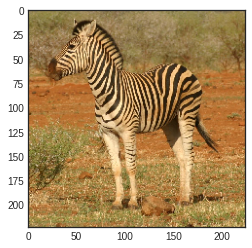

In [ ]:
img = image.load_img('zebra.jpg', target_size=(224, 224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = densenet.predict(x)
print(decode_predictions(preds))

## NasNet

* 신경망 구조를 사람이 설계하지 않고, complete search를 통해 자동으로 구조를 찾아냄
* 네트워크를 구성하는 layer를 하나씩 탐색하는 NAS 방법 대신, NasNet은 Convolution cell 단위를 먼저 추정하고, 이들을 조합하여 전체 네트워크 구성
* 성능은 높지만, 파라미터 수와 연산량은 절반 정도로 감소

In [ ]:
from tensorflow.keras.applications.nasnet import NASNetLarge, preprocess_input, decode_predictions

nasnet = NASNetLarge(include_top=True, weights='imagenet',
                     input_tensor=None, input_shape=None,
                     pooling=None, classes=1000)
nasnet.summary()

359759872/359748576 [==============================] - 4s 0us/step
Model: "NASNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 331, 331, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 165, 165, 96  2592        ['input_21[0][0]']               
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 165, 165, 96  384         ['stem_conv1[0][0]']             
                          

* notebook.jpg (https://cdn.pixabay.com/photo/2016/07/11/03/35/macbook-1508998_1280.jpg)

In [ ]:
!wget -O notebook.jpg https://cdn.pixabay.com/photo/2016/07/11/03/35/macbook-1508998_1280.jpg

--2021-11-19 13:53:04--  https://cdn.pixabay.com/photo/2016/07/11/03/35/macbook-1508998_1280.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.21.183, 104.18.20.183, 2606:4700::6812:14b7, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.21.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 258797 (253K) [image/jpeg]
Saving to: ‘notebook.jpg’

notebook.jpg        100%[===================>] 252.73K  1.47MB/s    in 0.2s    

2021-11-19 13:53:04 (1.47 MB/s) - ‘notebook.jpg’ saved [258797/258797]



[[('n03832673', 'notebook', 0.7909627), ('n03642806', 'laptop', 0.04911119), ('n04264628', 'space_bar', 0.03598758), ('n03085013', 'computer_keyboard', 0.019300193), ('n03777754', 'modem', 0.011484609)]]


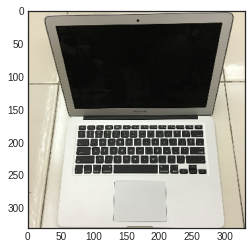

In [ ]:
img = image.load_img('notebook.jpg', target_size=(331, 331))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = nasnet.predict(x)
print(decode_predictions(preds))

## EfficientNet

* EfficientNetB0인 작은 모델에서 주어진 Task에 최적화된 구조로 수정해나가는 형태
* 복잡한 Task에 맞춰 모델의 Capacity를 늘리기 위해 Wide Scaling, Deep Scaling, 그리고 Resolution Scaling을 사용
* EfficientNet은 Wide, Deep, Resolution을 함께 고려하는 Compound Scaling을 사용

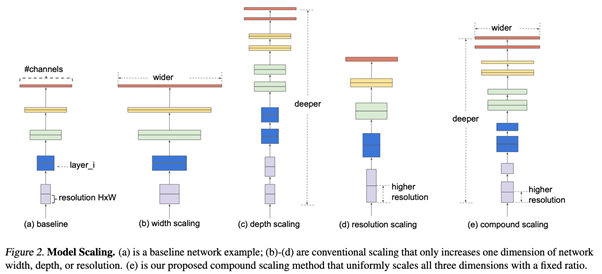

In [ ]:
from tensorflow.keras.applications.efficientnet import EfficientNetB1, preprocess_input, decode_predictions

efficientnet = EfficientNetB1(include_top=True, weights='imagenet',
                              input_tensor=None, input_shape=None,
                              pooling=None, classes=1000)
efficientnet.summary()

32161792/32148312 [==============================] - 0s 0us/step
Model: "efficientnetb1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 240, 240, 3)  0           ['input_22[0][0]']               
                                                                                                  
 normalization (Normalization)  (None, 240, 240, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad (Zero

* plane.jpg (https://upload.wikimedia.org/wikipedia/commons/1/12/Plane-in-flight.jpg)

In [ ]:
!wget -O plane.jpg https://upload.wikimedia.org/wikipedia/commons/1/12/Plane-in-flight.jpg

--2021-11-19 13:56:11--  https://upload.wikimedia.org/wikipedia/commons/1/12/Plane-in-flight.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 487351 (476K) [image/jpeg]
Saving to: ‘plane.jpg’

plane.jpg           100%[===================>] 475.93K  --.-KB/s    in 0.08s   

2021-11-19 13:56:11 (5.55 MB/s) - ‘plane.jpg’ saved [487351/487351]



[[('n02690373', 'airliner', 0.8441163), ('n04592741', 'wing', 0.06882913), ('n04552348', 'warplane', 0.033058006), ('n04266014', 'space_shuttle', 0.0045533576), ('n01494475', 'hammerhead', 0.0019974676)]]


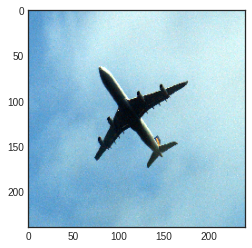

In [ ]:
img = image.load_img('plane.jpg', target_size=(240, 240))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = efficientnet.predict(x)
print(decode_predictions(preds))